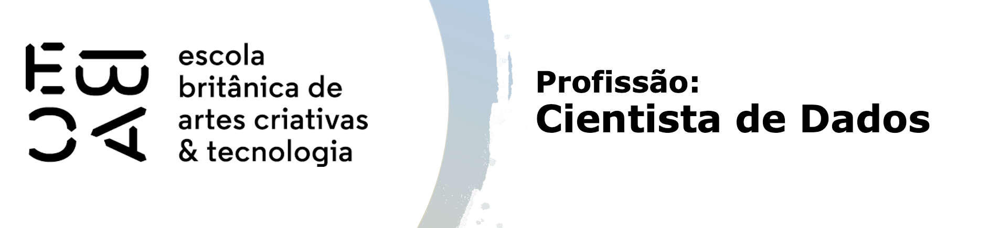

# Tarefa II

Neste projeto, estamos construindo um credit scoring para cartão de crédito, em um desenho amostral com 15 safras, e utilizando 12 meses de performance.

Carregue a base de dados ```credit_scoring.ftr```.

In [80]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns

import statsmodels.formula.api as smf
import statsmodels.api as sm

from sklearn import metrics
from scipy.stats import ks_2samp
from scipy.stats import t

from statsmodels.stats.outliers_influence import variance_inflation_factor as vif

from pyod.models.knn import KNN

In [81]:
df = pd.read_feather('./Dados/credit_scoring.ftr')
df.head()

,data_ref,index,sexo,posse_de_veiculo,posse_de_imovel,qtd_filhos,tipo_renda,educacao,estado_civil,tipo_residencia,idade,tempo_emprego,qt_pessoas_residencia,renda,mau
0,2015-01-01,5733,F,N,N,0,Empresário,Médio,Solteiro,Casa,43,6.873973,1.0,2515.39,False
1,2015-01-01,727,F,S,S,0,Assalariado,Médio,Casado,Casa,35,4.526027,2.0,3180.19,False
2,2015-01-01,6374,F,N,N,2,Assalariado,Médio,Casado,Casa,31,0.243836,4.0,1582.29,False
3,2015-01-01,9566,F,N,N,0,Assalariado,Médio,Casado,Casa,54,12.772603,2.0,13721.17,False
4,2015-01-01,9502,F,S,N,0,Assalariado,Superior incompleto,Solteiro,Casa,31,8.432877,1.0,2891.08,False


In [82]:
df.tempo_emprego.describe()

count    624043.000000
mean          7.748574
std           6.687455
min           0.117808
25%           3.049315
50%           6.046575
75%          10.183562
max          42.906849
Name: tempo_emprego, dtype: float64

In [83]:
df.isnull().sum()

data_ref                      0
index                         0
sexo                          0
posse_de_veiculo              0
posse_de_imovel               0
qtd_filhos                    0
tipo_renda                    0
educacao                      0
estado_civil                  0
tipo_residencia               0
idade                         0
tempo_emprego            125957
qt_pessoas_residencia         0
renda                         0
mau                           0
dtype: int64

In [84]:
df['tempo_emprego'] = df['tempo_emprego'].fillna(df['tempo_emprego'].median())

In [85]:
df.tempo_emprego.describe()

count    750000.000000
mean          7.462736
std           6.133196
min           0.117808
25%           3.635616
50%           6.046575
75%           9.090411
max          42.906849
Name: tempo_emprego, dtype: float64

In [86]:
df.isnull().sum()

data_ref                 0
index                    0
sexo                     0
posse_de_veiculo         0
posse_de_imovel          0
qtd_filhos               0
tipo_renda               0
educacao                 0
estado_civil             0
tipo_residencia          0
idade                    0
tempo_emprego            0
qt_pessoas_residencia    0
renda                    0
mau                      0
dtype: int64

In [87]:
print('numero de linhas: {0} \nnúmero de colunas: {1}'.format(df.shape[0], df.shape[1]))
df.mau.value_counts(normalize=True)

numero de linhas: 750000 
número de colunas: 15


False    0.921809
True     0.078191
Name: mau, dtype: float64

In [88]:
df['data_ref'].unique()

array(['2015-01-01T00:00:00.000000000', '2015-02-01T00:00:00.000000000',
       '2015-03-01T00:00:00.000000000', '2015-04-01T00:00:00.000000000',
       '2015-05-01T00:00:00.000000000', '2015-06-01T00:00:00.000000000',
       '2015-07-01T00:00:00.000000000', '2015-08-01T00:00:00.000000000',
       '2015-09-01T00:00:00.000000000', '2015-10-01T00:00:00.000000000',
       '2015-11-01T00:00:00.000000000', '2015-12-01T00:00:00.000000000',
       '2016-01-01T00:00:00.000000000', '2016-02-01T00:00:00.000000000',
       '2016-03-01T00:00:00.000000000'], dtype='datetime64[ns]')

## Amostragem

Separe os três últimos meses como safras de validação *out of time* (oot).

Variáveis:<br>
Considere que a variável ```data_ref``` não é uma variável explicativa, é somente uma variável indicadora da safra, e não deve ser utilizada na modelagem. A variávei ```index``` é um identificador do cliente, e também não deve ser utilizada como covariável (variável explicativa). As restantes podem ser utilizadas para prever a inadimplência, incluindo a renda.


In [89]:
df_3meses = df[df["data_ref"].isin(pd.date_range("2016-01-01", "2016-03-01"))]
df_3meses["data_ref"].unique()

array(['2016-01-01T00:00:00.000000000', '2016-02-01T00:00:00.000000000',
       '2016-03-01T00:00:00.000000000'], dtype='datetime64[ns]')

In [90]:
df_3meses.mau.value_counts()

False    128000
True      22000
Name: mau, dtype: int64

In [91]:
metadados = pd.DataFrame(df_3meses.dtypes, columns=['dtype'])
metadados['nmissing'] = df.isna().sum()
metadados['valores_unicos'] = df.nunique()

metadados

,dtype,nmissing,valores_unicos
data_ref,datetime64[ns],0,15
index,int64,0,16650
sexo,object,0,2
posse_de_veiculo,object,0,2
posse_de_imovel,object,0,2
qtd_filhos,int64,0,8
tipo_renda,object,0,5
educacao,object,0,5
estado_civil,object,0,5
tipo_residencia,object,0,6


In [92]:
# Transformar a variável resposta em inteiro
df_3meses['mau'] = df_3meses.mau.astype('int64')

C:\Users\lucca\AppData\Local\Temp\ipykernel_23368\1743017505.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



## Descritiva básica univariada

- Descreva a base quanto ao número de linhas, número de linhas para cada mês em ```data_ref```.
- Faça uma descritiva básica univariada de cada variável. Considere as naturezas diferentes: qualitativas e quantitativas.

In [93]:
df_3meses.groupby('data_ref')['mau'].count()

data_ref
2016-01-01    50000
2016-02-01    50000
2016-03-01    50000
Name: mau, dtype: int64

#### A base selecionada com os últimos 3 meses apresenta-se com cerca de 50000 linhas para cada mês (jan, fev e mar de 2016)

In [94]:
def IV(variavel, resposta):
    tab = pd.crosstab(variavel, resposta, margins=True, margins_name='total')

    rótulo_evento = tab.columns[0]
    rótulo_nao_evento = tab.columns[1]

    tab['pct_evento'] = tab[rótulo_evento]/tab.loc['total',rótulo_evento]
    tab['pct_nao_evento'] = tab[rótulo_nao_evento]/tab.loc['total',rótulo_nao_evento]
    coringa = 0.00001
    tab['woe'] = np.log(tab.pct_evento+coringa/tab.pct_nao_evento+coringa)
    tab['iv_parcial'] = (tab.pct_evento - tab.pct_nao_evento)*tab.woe
    return tab['iv_parcial'].sum()



In [95]:
iv = IV(df_3meses.renda, df_3meses.mau)
iv

inf

In [96]:
metadados['papel'] = 'covariavel'
metadados.loc['mau','papel'] = 'resposta'
metadados['nunique'] = df.nunique()
metadados

,dtype,nmissing,valores_unicos,papel,nunique
data_ref,datetime64[ns],0,15,covariavel,15
index,int64,0,16650,covariavel,16650
sexo,object,0,2,covariavel,2
posse_de_veiculo,object,0,2,covariavel,2
posse_de_imovel,object,0,2,covariavel,2
qtd_filhos,int64,0,8,covariavel,8
tipo_renda,object,0,5,covariavel,5
educacao,object,0,5,covariavel,5
estado_civil,object,0,5,covariavel,5
tipo_residencia,object,0,6,covariavel,6


In [97]:
for var in metadados[metadados.papel=='covariavel'].index:
    metadados.loc[var, 'IV'] = IV(df_3meses[var], df_3meses.mau)
metadados

,dtype,nmissing,valores_unicos,papel,nunique,IV
data_ref,datetime64[ns],0,15,covariavel,15,0.003031
index,int64,0,16650,covariavel,16650,inf
sexo,object,0,2,covariavel,2,-0.013592
posse_de_veiculo,object,0,2,covariavel,2,-0.002943
posse_de_imovel,object,0,2,covariavel,2,0.036188
qtd_filhos,int64,0,8,covariavel,8,0.017512
tipo_renda,object,0,5,covariavel,5,-0.030957
educacao,object,0,5,covariavel,5,-0.001897
estado_civil,object,0,5,covariavel,5,0.020244
tipo_residencia,object,0,6,covariavel,6,0.038214


In [98]:
df_3meses_select = df_3meses[['sexo', 'posse_de_imovel', 'qtd_filhos', 'tipo_renda', 'estado_civil', 'tipo_residencia', 'idade', 'mau']]

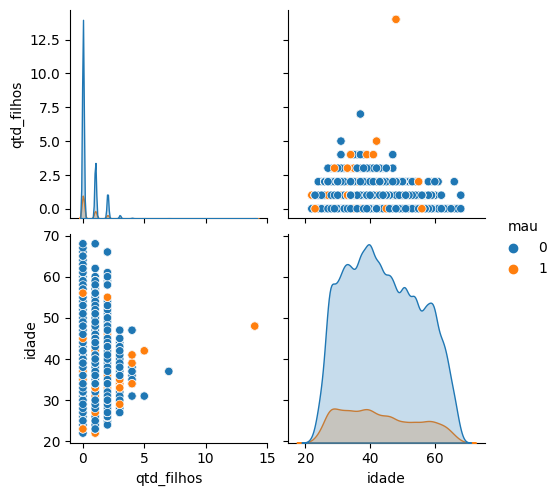

In [99]:
sns.pairplot(df_3meses_select, hue="mau")

## Descritiva bivariada

Faça uma análise descritiva bivariada de cada variável

In [100]:
metadados = pd.DataFrame(df_3meses.dtypes, columns=['dtype'])
metadados['nmissing'] = df_3meses.isna().sum()
metadados['valores_unicos'] = df_3meses.nunique()
metadados['papel'] = 'covariavel'
metadados.loc['mau','papel'] = 'resposta'
metadados.loc['bom','papel'] = 'resposta'
metadados

,dtype,nmissing,valores_unicos,papel
data_ref,datetime64[ns],0.0,3.0,covariavel
index,int64,0.0,16648.0,covariavel
sexo,object,0.0,2.0,covariavel
posse_de_veiculo,object,0.0,2.0,covariavel
posse_de_imovel,object,0.0,2.0,covariavel
qtd_filhos,int64,0.0,8.0,covariavel
tipo_renda,object,0.0,5.0,covariavel
educacao,object,0.0,5.0,covariavel
estado_civil,object,0.0,5.0,covariavel
tipo_residencia,object,0.0,6.0,covariavel


In [101]:
var='idade'
IV(pd.qcut(df_3meses[var],5,duplicates='drop'), df_3meses.mau)

-0.0067848372148789065

In [102]:
for var in metadados[metadados.papel=='covariavel'].index:
    if  (metadados.loc[var, 'valores_unicos']>6):
        metadados.loc[var, 'IV'] = IV(pd.qcut(df[var],5,duplicates='drop'), df.mau)
    else: 
        metadados.loc[var, 'IV'] = IV(df[var], df.mau)

    
metadados

,dtype,nmissing,valores_unicos,papel,IV
data_ref,datetime64[ns],0.0,3.0,covariavel,0.031033
index,int64,0.0,16648.0,covariavel,0.000209
sexo,object,0.0,2.0,covariavel,-0.015517
posse_de_veiculo,object,0.0,2.0,covariavel,-0.002274
posse_de_imovel,object,0.0,2.0,covariavel,0.034312
qtd_filhos,int64,0.0,8.0,covariavel,0.003597
tipo_renda,object,0.0,5.0,covariavel,-0.035721
educacao,object,0.0,5.0,covariavel,-0.006788
estado_civil,object,0.0,5.0,covariavel,0.023730
tipo_residencia,object,0.0,6.0,covariavel,0.042005


In [103]:
def biv_discreta(var, df):
    df['bom'] = 1-df_3meses.mau
    g = df.groupby(var)

    biv = pd.DataFrame({'qt_bom': g['bom'].sum(),
                        'qt_mau': g['mau'].sum(),
                        'mau':g['mau'].mean(), 
                        var: g['mau'].mean().index, 
                        'cont':g[var].count()})
    
    biv['ep'] = (biv.mau*(1-biv.mau)/biv.cont)**.5
    biv['mau_sup'] = biv.mau+t.ppf([0.975], biv.cont-1)*biv.ep
    biv['mau_inf'] = biv.mau+t.ppf([0.025], biv.cont-1)*biv.ep
    
    biv['logit'] = np.log(biv.mau/(1-biv.mau))
    biv['logit_sup'] = np.log(biv.mau_sup/(1-biv.mau_sup))
    biv['logit_inf'] = np.log(biv.mau_inf/(1-biv.mau_inf))

    tx_mau_geral = df.mau.mean()
    woe_geral = np.log(df.mau.mean() / (1 - df.mau.mean()))

    biv['woe'] = biv.logit - woe_geral
    biv['woe_sup'] = biv.logit_sup - woe_geral
    biv['woe_inf'] = biv.logit_inf - woe_geral

    fig, ax = plt.subplots(2,1, figsize=(8,6))
    ax[0].plot(biv[var], biv.woe, ':bo', label='woe')
    ax[0].plot(biv[var], biv.woe_sup, 'o:r', label='limite superior')
    ax[0].plot(biv[var], biv.woe_inf, 'o:r', label='limite inferior')
    
    num_cat = biv.shape[0]
    ax[0].set_xlim([-.3, num_cat-.7])

    ax[0].set_ylabel("Weight of Evidence")
    ax[0].legend(bbox_to_anchor=(.83, 1.17), ncol=3)
    
    ax[0].set_xticks(list(range(num_cat)))
    ax[0].set_xticklabels(biv[var], rotation=15)
    
    ax[1] = biv.cont.plot.bar()
    return biv

C:\Users\lucca\AppData\Local\Temp\ipykernel_23368\2436534518.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



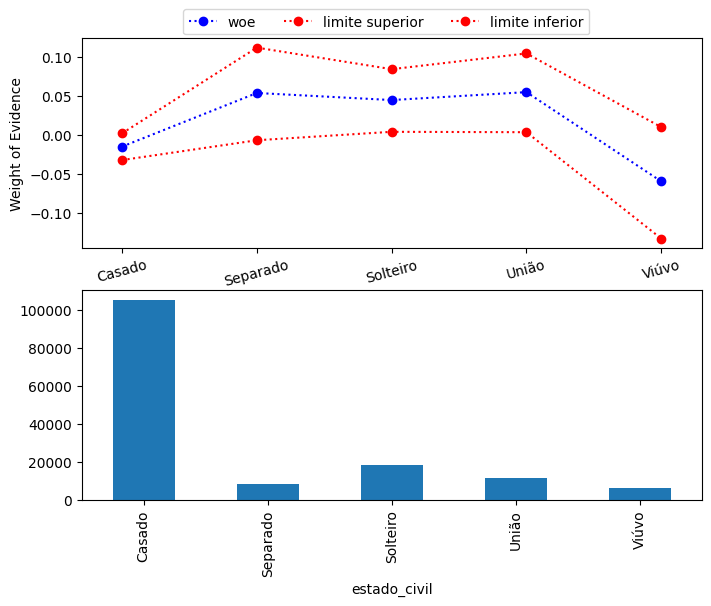

In [104]:
biv_discreta('estado_civil', df_3meses);

C:\Users\lucca\AppData\Local\Temp\ipykernel_23368\2436534518.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\lucca\anaconda3\lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning:

invalid value encountered in log



,qt_bom,qt_mau,mau,tipo_renda,cont,ep,mau_sup,mau_inf,logit,logit_sup,logit_inf,woe,woe_sup,woe_inf
tipo_renda,,,,,,,,,,,,,,
Assalariado,65662,11618,0.150336,Assalariado,77280,0.001286,0.152856,0.147817,-1.731965,-1.712372,-1.751830,0.029023,0.048616,0.009158
Bolsista,67,3,0.042857,Bolsista,70,0.024208,0.091150,-0.005436,-3.106080,-2.299675,NaN,-1.345093,-0.538687,NaN
Empresário,29573,4998,0.144572,Empresário,34571,0.001891,0.148279,0.140865,-1.777824,-1.748162,-1.808125,-0.016836,0.012826,-0.047137
Pensionista,21198,3940,0.156735,Pensionista,25138,0.002293,0.161229,0.152240,-1.682726,-1.649111,-1.717136,0.078262,0.111877,0.043852
Servidor público,11500,1441,0.111352,Servidor público,12941,0.002765,0.116772,0.105931,-2.077010,-2.023362,-2.132992,-0.316022,-0.262375,-0.372004


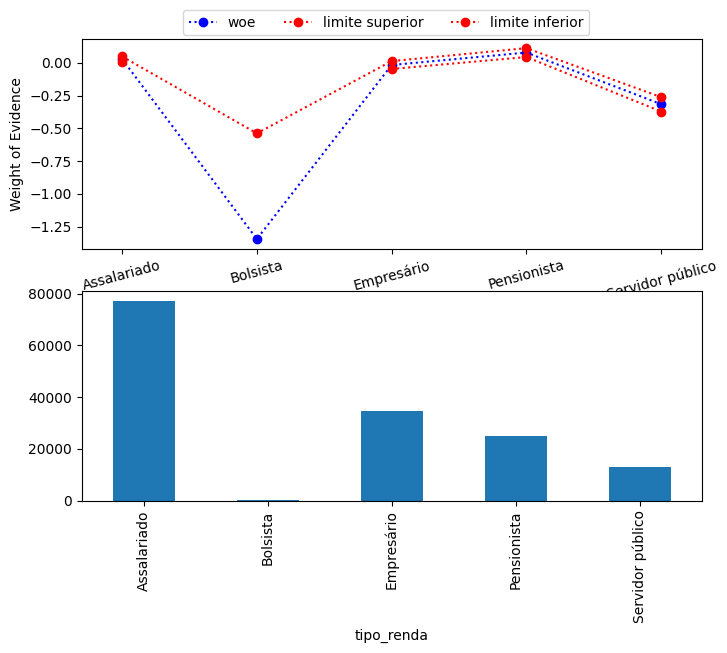

In [105]:
biv_discreta('tipo_renda', df_3meses)

,qt_bom,qt_mau,mau,tipo_renda,cont,ep,mau_sup,mau_inf,logit,logit_sup,logit_inf,woe,woe_sup,woe_inf
tipo_renda,,,,,,,,,,,,,,
Assalariado,65662,11618,0.150336,Assalariado,77280,0.001286,0.152856,0.147817,-1.731965,-1.712372,-1.751830,0.029023,0.048616,0.009158
Empresário,29573,4998,0.144572,Empresário,34571,0.001891,0.148279,0.140865,-1.777824,-1.748162,-1.808125,-0.016836,0.012826,-0.047137
Pensionista,21198,3940,0.156735,Pensionista,25138,0.002293,0.161229,0.152240,-1.682726,-1.649111,-1.717136,0.078262,0.111877,0.043852
St. ser.pub/bols.,11567,1444,0.110983,St. ser.pub/bols.,13011,0.002754,0.116381,0.105585,-2.080739,-2.027159,-2.136651,-0.319751,-0.266171,-0.375663


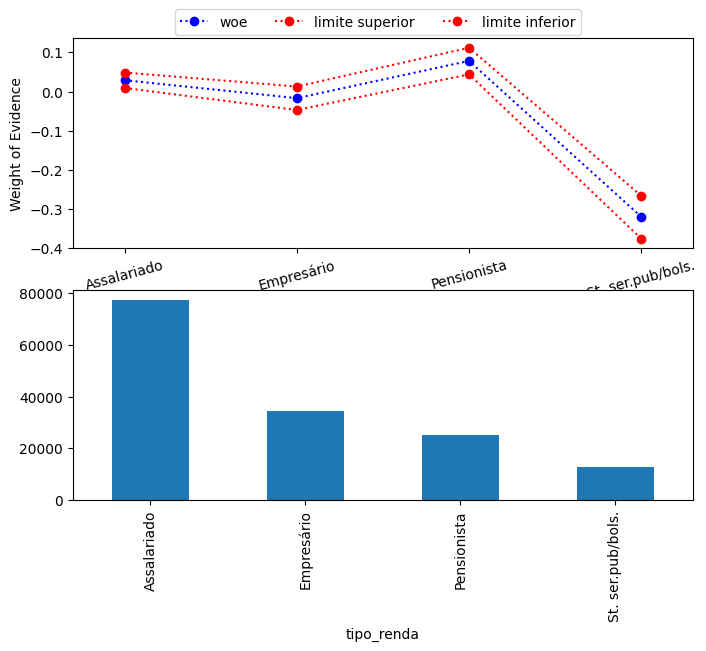

In [106]:
df2 = df_3meses.copy()
df2.tipo_renda.replace({'Bolsista': 'St. ser.pub/bols.', 'Servidor público': 'St. ser.pub/bols.'}, inplace=True)
biv_discreta('tipo_renda', df2)

In [107]:
IV(df2.tipo_renda, df_3meses.mau)

-0.030736992319759078

,qt_bom,qt_mau,mau,educacao,cont,ep,mau_sup,mau_inf,logit,logit_sup,logit_inf,woe,woe_sup,woe_inf
educacao,,,,,,,,,,,,,,
Fundamental,1369,305,0.182198,Fundamental,1674,0.009434,0.200703,0.163694,-1.501524,-1.381907,-1.630998,0.259464,0.379081,0.129990
Médio,86167,15220,0.150118,Médio,101387,0.001122,0.152317,0.147919,-1.733677,-1.716547,-1.751015,0.027311,0.044441,0.009973
Pós graduação,145,16,0.099379,Pós graduação,161,0.023578,0.145943,0.052815,-2.204145,-1.766782,-2.886702,-0.443157,-0.005795,-1.125714
Superior completo,35330,5536,0.135467,Superior completo,40866,0.001693,0.138785,0.132149,-1.853460,-1.825416,-1.882090,-0.092472,-0.064429,-0.121102
Superior incompleto,4989,923,0.156123,Superior incompleto,5912,0.004721,0.165377,0.146869,-1.687362,-1.618749,-1.759373,0.073626,0.142238,0.001615


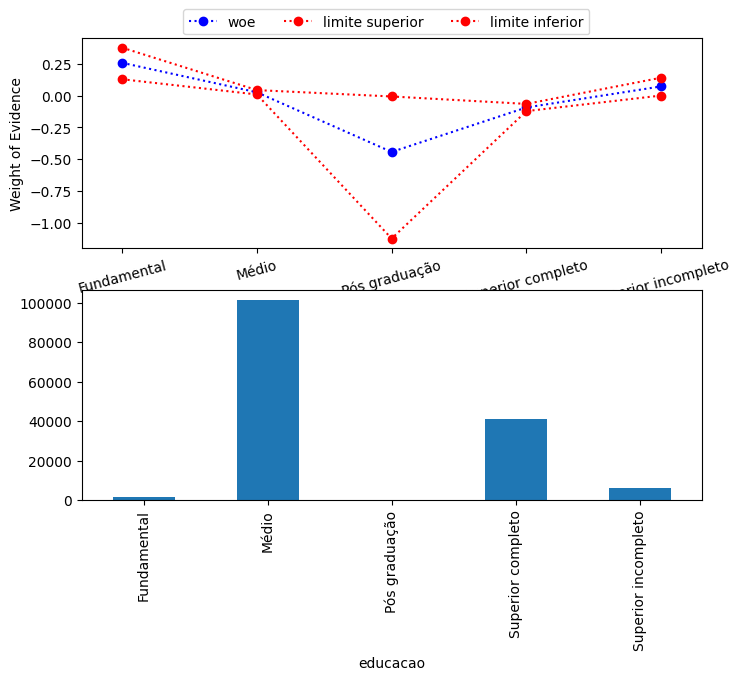

In [108]:
biv_discreta('educacao', df2)

,qt_bom,qt_mau,mau,educacao,cont,ep,mau_sup,mau_inf,logit,logit_sup,logit_inf,woe,woe_sup,woe_inf
educacao,,,,,,,,,,,,,,
Fundamental,1369,305,0.182198,Fundamental,1674,0.009434,0.200703,0.163694,-1.501524,-1.381907,-1.630998,0.259464,0.379081,0.129990
Médio,86167,15220,0.150118,Médio,101387,0.001122,0.152317,0.147919,-1.733677,-1.716547,-1.751015,0.027311,0.044441,0.009973
Sup.Comp. / Pós,35330,5536,0.135467,Sup.Comp. / Pós,40866,0.001693,0.138785,0.132149,-1.853460,-1.825416,-1.882090,-0.092472,-0.064429,-0.121102
Superior incompleto,5134,939,0.154619,Superior incompleto,6073,0.004639,0.163714,0.145524,-1.698825,-1.630853,-1.770147,0.062163,0.130135,-0.009159


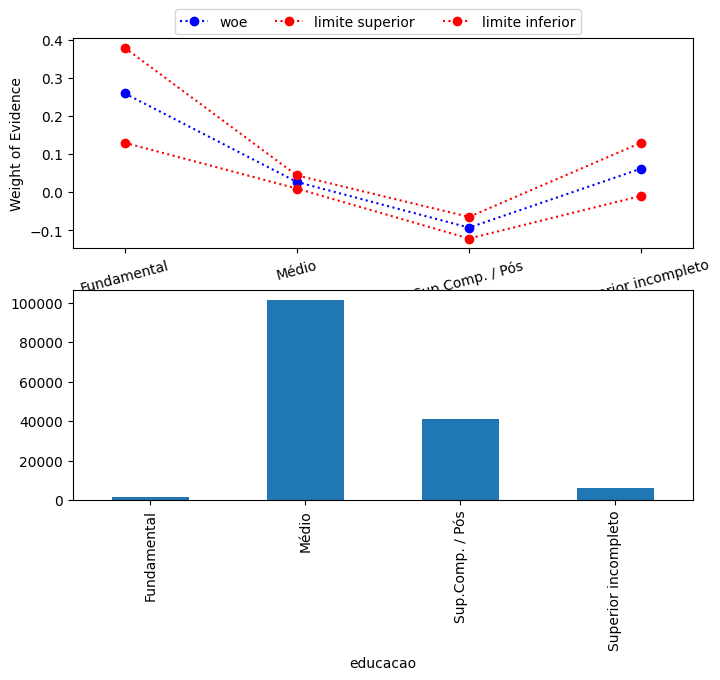

In [109]:
df2.educacao.replace({'Pós graduação':'Superior incompleto', 'Superior completo': 'Sup.Comp. / Pós'}, inplace=True)
biv_discreta('educacao', df2)

-0.01682469485548479

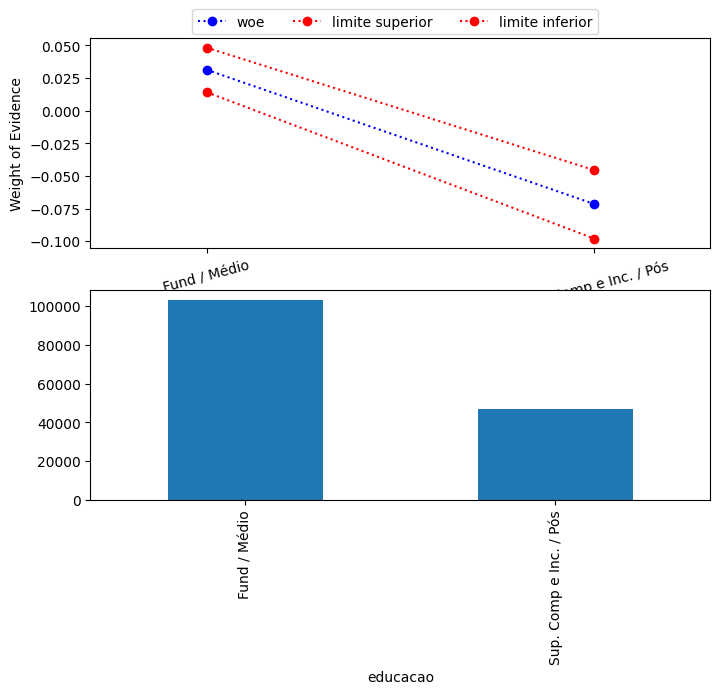

In [110]:
df2.educacao.replace({'Superior incompleto':'Sup. Comp e Inc. / Pós',
                      'Sup.Comp. / Pós' : 'Sup. Comp e Inc. / Pós',
                      'Fundamental':'Fund / Médio',
                      'Médio': 'Fund / Médio'
                     }, inplace=True)
biv_discreta('educacao', df2)
IV(df2.educacao, df.mau)

,qt_bom,qt_mau,mau,tipo_residencia,cont,ep,mau_sup,mau_inf,logit,logit_sup,logit_inf,woe,woe_sup,woe_inf
tipo_residencia,,,,,,,,,,,,,,
Aluguel,1750,337,0.161476,Aluguel,2087,0.008055,0.177272,0.145680,-1.647288,-1.534941,-1.768896,0.113700,0.226047,-0.007908
Casa,115401,19557,0.144912,Casa,134958,0.000958,0.146790,0.143034,-1.775080,-1.760004,-1.790318,-0.014092,0.000984,-0.029331
Com os pais,5353,1149,0.176715,Com os pais,6502,0.004730,0.185988,0.167442,-1.538765,-1.476294,-1.603866,0.222223,0.284693,0.157121
Comunitário,563,93,0.141768,Comunitário,656,0.013619,0.168510,0.115026,-1.800680,-1.596223,-2.040396,-0.039692,0.164765,-0.279408
Estúdio,971,128,0.116470,Estúdio,1099,0.009676,0.135456,0.097483,-2.026296,-1.853555,-2.225509,-0.265308,-0.092567,-0.464522
Governamental,3962,736,0.156662,Governamental,4698,0.005303,0.167059,0.146266,-1.683274,-1.606617,-1.764193,0.077714,0.154371,-0.003206


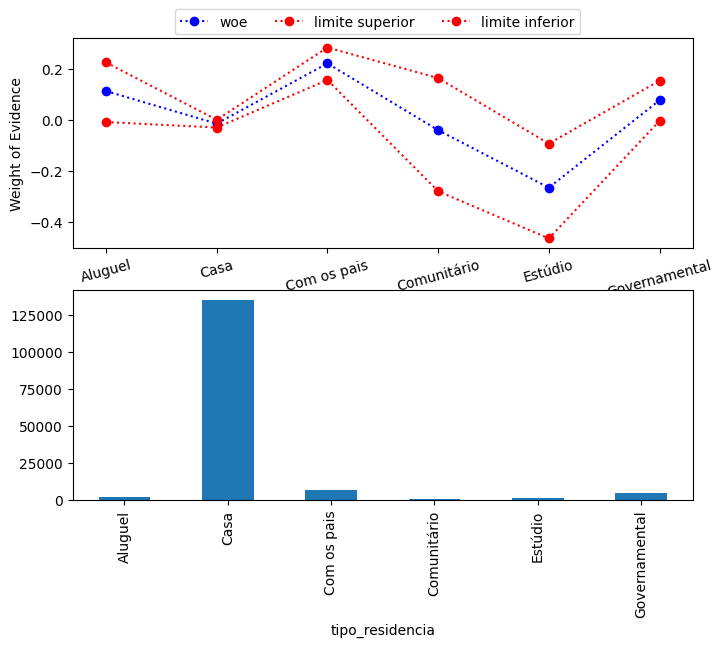

In [111]:
biv_discreta('tipo_residencia', df2)

In [112]:
df2

,data_ref,index,sexo,posse_de_veiculo,posse_de_imovel,qtd_filhos,tipo_renda,educacao,estado_civil,tipo_residencia,idade,tempo_emprego,qt_pessoas_residencia,renda,mau,bom
600000,2016-01-01,8906,F,S,S,2,Assalariado,Sup. Comp e Inc. / Pós,Casado,Casa,38,7.383562,4.0,2969.49,1,0
600001,2016-01-01,5063,F,N,S,0,Assalariado,Fund / Médio,Casado,Casa,55,8.471233,2.0,6278.37,0,1
600002,2016-01-01,16401,M,S,S,1,Assalariado,Fund / Médio,União,Casa,39,8.884932,3.0,14010.18,0,1
600003,2016-01-01,6786,F,N,S,1,Assalariado,Fund / Médio,União,Com os pais,31,1.794521,3.0,2875.81,0,1
600004,2016-01-01,13466,M,S,N,0,Assalariado,Fund / Médio,Casado,Casa,27,7.019178,2.0,2737.19,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
749995,2016-03-01,13689,M,N,S,0,Empresário,Sup. Comp e Inc. / Pós,Casado,Casa,48,3.038356,2.0,2109.99,0,1
749996,2016-03-01,7000,F,N,S,0,Pensionista,Fund / Médio,Solteiro,Casa,65,6.046575,1.0,1389.39,0,1
749997,2016-03-01,14023,M,S,N,2,Assalariado,Fund / Médio,Casado,Casa,43,10.375342,4.0,649.06,1,0
749998,2016-03-01,2396,F,N,S,0,Assalariado,Fund / Médio,Viúvo,Casa,56,13.780822,1.0,4216.72,1,0


## Desenvolvimento do modelo

Desenvolva um modelo de *credit scoring* através de uma regressão logística.

- Trate valores missings e outliers
- Trate 'zeros estruturais'
- Faça agrupamentos de categorias conforme vimos em aula
- Proponha uma equação preditiva para 'mau'
- Caso hajam categorias não significantes, justifique

### Identificando Outliers

In [113]:
detector = KNN()

In [114]:
df2 = df2.drop(columns=['data_ref', 'index'])

In [115]:
df2_dummies = pd.get_dummies(df2)

In [116]:
detector.fit(df2_dummies)

KNN(algorithm='auto', contamination=0.1, leaf_size=30, method='largest',
  metric='minkowski', metric_params=None, n_jobs=1, n_neighbors=5, p=2,
  radius=1.0)

In [117]:
previsoes = detector.labels_
previsoes

array([0, 0, 1, ..., 0, 1, 0])

In [118]:
np.unique(previsoes, return_counts=True)

(array([0, 1]), array([135003,  14997], dtype=int64))

In [119]:
confianca_previsoes = detector.decision_scores_
confianca_previsoes

array([5.23120556, 4.92558262, 7.63286502, ..., 5.19680403, 8.76266925,
       5.1509553 ])

In [120]:
outliers = []
for i in range(len(previsoes)):
    if previsoes[i] == 1:
        outliers.append(i)

In [121]:
print(outliers)

[2, 7, 30, 32, 43, 48, 60, 68, 88, 91, 92, 108, 111, 124, 137, 140, 186, 217, 219, 223, 228, 230, 231, 240, 242, 244, 250, 264, 266, 286, 289, 293, 295, 308, 313, 320, 327, 330, 335, 339, 348, 370, 372, 374, 375, 382, 387, 399, 406, 407, 416, 420, 423, 428, 439, 447, 450, 456, 461, 465, 466, 469, 478, 482, 489, 499, 509, 516, 517, 537, 563, 564, 565, 570, 577, 580, 581, 586, 612, 629, 632, 641, 649, 652, 653, 659, 663, 664, 671, 677, 690, 705, 736, 738, 743, 746, 748, 752, 775, 807, 830, 831, 832, 852, 858, 865, 869, 874, 876, 906, 908, 935, 949, 957, 958, 964, 967, 971, 972, 1001, 1014, 1021, 1035, 1050, 1070, 1079, 1086, 1088, 1091, 1096, 1108, 1113, 1130, 1137, 1144, 1157, 1161, 1175, 1176, 1203, 1208, 1209, 1262, 1265, 1276, 1281, 1295, 1298, 1302, 1310, 1312, 1313, 1320, 1328, 1331, 1332, 1354, 1359, 1376, 1377, 1378, 1385, 1386, 1389, 1390, 1392, 1404, 1417, 1423, 1436, 1443, 1447, 1452, 1455, 1461, 1469, 1478, 1487, 1499, 1513, 1525, 1532, 1539, 1540, 1543, 1556, 1560, 1563, 156

In [122]:
lista_outliers = df2.iloc[outliers,:]
lista_outliers.head()

,sexo,posse_de_veiculo,posse_de_imovel,qtd_filhos,tipo_renda,educacao,estado_civil,tipo_residencia,idade,tempo_emprego,qt_pessoas_residencia,renda,mau,bom
600002,M,S,S,1,Assalariado,Fund / Médio,União,Casa,39,8.884932,3.0,14010.18,0,1
600007,M,S,S,1,Empresário,Sup. Comp e Inc. / Pós,União,Casa,42,18.205479,3.0,42854.98,0,1
600030,F,S,S,0,Assalariado,Fund / Médio,Casado,Casa,54,34.495890,2.0,77023.40,0,1
600032,M,N,S,0,Empresário,Sup. Comp e Inc. / Pós,Casado,Casa,60,7.630137,2.0,9452.33,0,1
600043,M,S,N,0,Assalariado,Fund / Médio,Solteiro,Casa,49,7.701370,1.0,16121.04,0,1


In [123]:
lista_outliers_reset = lista_outliers.reset_index()
lista_outliers_reset = lista_outliers_reset.rename(columns={'index': 'linhas'})
lista_outliers_reset['linhas'].head()

0    600002
1    600007
2    600030
3    600032
4    600043
Name: linhas, dtype: int64

In [124]:
linhas = lista_outliers_reset['linhas'].tolist()
linhas

[600002,
 600007,
 600030,
 600032,
 600043,
 600048,
 600060,
 600068,
 600088,
 600091,
 600092,
 600108,
 600111,
 600124,
 600137,
 600140,
 600186,
 600217,
 600219,
 600223,
 600228,
 600230,
 600231,
 600240,
 600242,
 600244,
 600250,
 600264,
 600266,
 600286,
 600289,
 600293,
 600295,
 600308,
 600313,
 600320,
 600327,
 600330,
 600335,
 600339,
 600348,
 600370,
 600372,
 600374,
 600375,
 600382,
 600387,
 600399,
 600406,
 600407,
 600416,
 600420,
 600423,
 600428,
 600439,
 600447,
 600450,
 600456,
 600461,
 600465,
 600466,
 600469,
 600478,
 600482,
 600489,
 600499,
 600509,
 600516,
 600517,
 600537,
 600563,
 600564,
 600565,
 600570,
 600577,
 600580,
 600581,
 600586,
 600612,
 600629,
 600632,
 600641,
 600649,
 600652,
 600653,
 600659,
 600663,
 600664,
 600671,
 600677,
 600690,
 600705,
 600736,
 600738,
 600743,
 600746,
 600748,
 600752,
 600775,
 600807,
 600830,
 600831,
 600832,
 600852,
 600858,
 600865,
 600869,
 600874,
 600876,
 600906,
 600908,
 

In [125]:
lista_outliers.shape

(14997, 14)

In [126]:
df2.shape

(150000, 14)

### Excluindo Outliers:


O Novo Dataframe deve conter cerca de 135.003 linhas. Como os outliers representam cerca de 10% do banco de dados, optou-se pela remoção desses valores.

In [127]:
df_2out = df2.copy()

In [128]:
df_2out = df_2out.reset_index()
df_2out = df_2out.rename(columns={'index': 'linhas_df'})
df_2out.head()

,linhas_df,sexo,posse_de_veiculo,posse_de_imovel,qtd_filhos,tipo_renda,educacao,estado_civil,tipo_residencia,idade,tempo_emprego,qt_pessoas_residencia,renda,mau,bom
0,600000,F,S,S,2,Assalariado,Sup. Comp e Inc. / Pós,Casado,Casa,38,7.383562,4.0,2969.49,1,0
1,600001,F,N,S,0,Assalariado,Fund / Médio,Casado,Casa,55,8.471233,2.0,6278.37,0,1
2,600002,M,S,S,1,Assalariado,Fund / Médio,União,Casa,39,8.884932,3.0,14010.18,0,1
3,600003,F,N,S,1,Assalariado,Fund / Médio,União,Com os pais,31,1.794521,3.0,2875.81,0,1
4,600004,M,S,N,0,Assalariado,Fund / Médio,Casado,Casa,27,7.019178,2.0,2737.19,0,1


In [129]:
df_2out['linhas_df'].head()

0    600000
1    600001
2    600002
3    600003
4    600004
Name: linhas_df, dtype: int64

In [130]:
df_saida = df_2out.loc[~df_2out['linhas_df'].isin(linhas)] 

In [131]:
df_saida.shape

(135003, 15)

In [132]:
# ajuda para definir a equação da regressão
' + '.join(list(df_saida.columns))

'linhas_df + sexo + posse_de_veiculo + posse_de_imovel + qtd_filhos + tipo_renda + educacao + estado_civil + tipo_residencia + idade + tempo_emprego + qt_pessoas_residencia + renda + mau + bom'

### Ordenando por ordem decrescente as variáveis pelo IV:

In [133]:
metadados.sort_values(by='IV', ascending=False)

,dtype,nmissing,valores_unicos,papel,IV
renda,float64,0.0,46077.0,covariavel,0.085975
tipo_residencia,object,0.0,6.0,covariavel,0.042005
posse_de_imovel,object,0.0,2.0,covariavel,0.034312
data_ref,datetime64[ns],0.0,3.0,covariavel,0.031033
estado_civil,object,0.0,5.0,covariavel,0.023730
qt_pessoas_residencia,float64,0.0,9.0,covariavel,0.022139
tempo_emprego,float64,0.0,3004.0,covariavel,0.017571
qtd_filhos,int64,0.0,8.0,covariavel,0.003597
index,int64,0.0,16648.0,covariavel,0.000209
posse_de_veiculo,object,0.0,2.0,covariavel,-0.002274


In [134]:
metadados.sort_values(by='IV', ascending=False)

,dtype,nmissing,valores_unicos,papel,IV
renda,float64,0.0,46077.0,covariavel,0.085975
tipo_residencia,object,0.0,6.0,covariavel,0.042005
posse_de_imovel,object,0.0,2.0,covariavel,0.034312
data_ref,datetime64[ns],0.0,3.0,covariavel,0.031033
estado_civil,object,0.0,5.0,covariavel,0.023730
qt_pessoas_residencia,float64,0.0,9.0,covariavel,0.022139
tempo_emprego,float64,0.0,3004.0,covariavel,0.017571
qtd_filhos,int64,0.0,8.0,covariavel,0.003597
index,int64,0.0,16648.0,covariavel,0.000209
posse_de_veiculo,object,0.0,2.0,covariavel,-0.002274


### Selecionando os IV com valores maiores que 1%:

In [135]:
formula = '''
    mau ~ sexo + posse_de_veiculo + posse_de_imovel + qtd_filhos + tipo_renda + educacao + estado_civil + tipo_residencia + idade + tempo_emprego + qt_pessoas_residencia + renda'''

rl = smf.glm(formula, data=df_saida, family=sm.families.Binomial()).fit()

rl.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                    mau   No. Observations:               135003
Model:                            GLM   Df Residuals:                   134981
Model Family:                Binomial   Df Model:                           21
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -54698.
Date:                Mon, 20 Nov 2023   Deviance:                   1.0930e+05
Time:                        20:56:31   Pearson chi2:                 9.01e+15
No. Iterations:                     8   Pseudo R-squ. (CS):            0.06560
Covariance Type:            nonrobust                                         
======================================================================================================
                                         coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
Intercept                             -0.8017      0.282     -2.839      0.005      -1.355      -0.248
sexo[T.M]                             -0.1037      0.018     -5.695      0.000      -0.139      -0.068
posse_de_veiculo[T.S]                  0.0129      0.017      0.747      0.455      -0.021       0.047
posse_de_imovel[T.S]                  -0.0772      0.017     -4.666      0.000      -0.110      -0.045
tipo_renda[T.Empresário]              -0.0349      0.019     -1.793      0.073      -0.073       0.003
tipo_renda[T.Pensionista]             -0.0712      0.028     -2.579      0.010      -0.125      -0.017
tipo_renda[T.St. ser.pub/bols.]       -0.0251      0.032     -0.780      0.435      -0.088       0.038
educacao[T.Sup. Comp e Inc. / Pós]    -0.0422      0.018     -2.404      0.016      -0.077      -0.008
estado_civil[T.Separado]               0.2085      0.140      1.488      0.137      -0.066       0.483
estado_civil[T.Solteiro]               0.1728      0.137      1.259      0.208      -0.096       0.442
estado_civil[T.União]                 -0.0228      0.029     -0.793      0.428      -0.079       0.034
estado_civil[T.Viúvo]                  0.1180      0.142      0.831      0.406      -0.160       0.397
tipo_residencia[T.Casa]               -0.0179      0.063     -0.283      0.777      -0.142       0.106
tipo_residencia[T.Com os pais]        -0.0109      0.071     -0.153      0.879      -0.151       0.129
tipo_residencia[T.Comunitário]        -0.2790      0.134     -2.082      0.037      -0.542      -0.016
tipo_residencia[T.Estúdio]            -0.0276      0.116     -0.237      0.812      -0.256       0.200
tipo_residencia[T.Governamental]       0.0429      0.076      0.565      0.572      -0.106       0.192
qtd_filhos                            -0.1759      0.136     -1.289      0.197      -0.443       0.092
idade                                 -0.0005      0.001     -0.559      0.576      -0.002       0.001
tempo_emprego                         -0.0205      0.003     -7.445      0.000      -0.026      -0.015
qt_pessoas_residencia                  0.1700      0.136      1.249      0.212      -0.097       0.437
renda                                 -0.0003   5.42e-06    -61.108      0.000      -0.000      -0.000
======================================================================================================
"""

## Excluindo as variáveis pelo valor do P>(z), com relevância em até 5%:

In [137]:
formula = '''
    mau ~ posse_de_imovel + tempo_emprego + renda + sexo + tipo_renda
'''

rl = smf.glm(formula, data=df_saida, family=sm.families.Binomial()).fit()

rl.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                    mau   No. Observations:               135003
Model:                            GLM   Df Residuals:                   134995
Model Family:                Binomial   Df Model:                            7
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -54708.
Date:                Mon, 20 Nov 2023   Deviance:                   1.0932e+05
Time:                        20:59:58   Pearson chi2:                 9.01e+15
No. Iterations:                     8   Pseudo R-squ. (CS):            0.06546
Covariance Type:            nonrobust                                         
===================================================================================================
                                      coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
Intercept                          -0.5110      0.020    -24.964      0.000      -0.551      -0.471
posse_de_imovel[T.S]               -0.0796      0.016     -4.936      0.000      -0.111      -0.048
sexo[T.M]                          -0.0972      0.017     -5.750      0.000      -0.130      -0.064
tipo_renda[T.Empresário]           -0.0377      0.019     -1.952      0.051      -0.076       0.000
tipo_renda[T.Pensionista]          -0.0790      0.021     -3.676      0.000      -0.121      -0.037
tipo_renda[T.St. ser.pub/bols.]    -0.0331      0.032     -1.035      0.301      -0.096       0.030
tempo_emprego                      -0.0202      0.003     -7.383      0.000      -0.026      -0.015
renda                              -0.0003    5.4e-06    -61.470      0.000      -0.000      -0.000
===================================================================================================
"""

## Avaliação do modelo

Avalie o poder discriminante do modelo pelo menos avaliando acurácia, KS e Gini.

Avalie estas métricas nas bases de desenvolvimento e *out of time*.

In [139]:
df_saida['score'] = rl.predict(df_saida)

# Acurácia
acc = metrics.accuracy_score(df_saida.mau, df_saida.score>.068)
#AUC
fpr, tpr, thresholds = metrics.roc_curve(df_saida.mau, df_saida.score)
auc = metrics.auc(fpr, tpr)
#Gini
gini = 2*auc -1
ks = ks_2samp(df_saida.loc[df_saida.mau == 1, 'score'], df_saida.loc[df_saida.mau != 1, 'score']).statistic

print('Acurácia: {0:.1%} \nAUC: {1:.1%} \nGINI: {2:.1%}\nKS: {3:.1%}'
      .format(acc, auc, gini, ks))

Acurácia: 33.4% 
AUC: 71.6% 
GINI: 43.1%
KS: 31.6%


C:\Users\lucca\AppData\Local\Temp\ipykernel_23368\1761371812.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



## Relatórios de Características:

In [140]:
def perfil_var(df, var, ev='mau', score='score', ncat=None):
    
    _df = df.copy()
    _df['ev'] = _df[ev]
    _df['nev'] = 1 - _df[ev]
    
    if ncat == None:
        g = _df.groupby(var)
    else:
        g = _df.groupby(pd.qcut(_df[var], ncat, duplicates='drop'))

    tg = g.agg({score:'mean', 'ev':'sum', 'nev':'sum'})
    tg['total'] = tg.ev + tg.nev
    tg['distribuição'] = tg.total/tg.total.sum()

    tg['total_acum'] = tg['total'].cumsum()
    tg['ev_acum']    = tg.ev.cumsum()
    tg['nev_acum']   = tg.nev.cumsum()

    tg['tx_ev']     = tg.ev/tg.total
    tg['ep']        = (tg.tx_ev*(1-tg.tx_ev)/tg.total)**.5
    tg['tx_ev_sup'] = tg.score+t.ppf([0.025], tg.total-1)*tg.ep
    tg['tx_ev_inf'] = tg.score+t.ppf([0.975], tg.total-1)*tg.ep

    fig, ax = plt.subplots()
    
    if ncat == None:
        ax.plot(tg.reset_index()[var], tg.reset_index(drop=True).score    , 'b-' , label='esperado')
        ax.plot(tg.reset_index()[var], tg.reset_index(drop=True).tx_ev    , 'r--', label='observado')
        ax.plot(tg.reset_index()[var], tg.reset_index(drop=True).tx_ev_sup, 'r:',  label='obs-ls')
        ax.plot(tg.reset_index()[var], tg.reset_index(drop=True).tx_ev_inf, 'r:',  label='obs-li')
    else:
        tg[var+'_med'] = g[var].mean()
        ax.plot(tg[var+'_med'], tg.reset_index(drop=True).score    , 'b-' , label='esperado')
        ax.plot(tg[var+'_med'], tg.reset_index(drop=True).tx_ev    , 'r--', label='observado')
        ax.plot(tg[var+'_med'], tg.reset_index(drop=True).tx_ev_sup, 'r:',  label='obs-ls')
        ax.plot(tg[var+'_med'], tg.reset_index(drop=True).tx_ev_inf, 'r:',  label='obs-li')
    return tg[['distribuição', score, 'tx_ev']]


,tempo_emprego,distribuição,score,tx_ev
0,"(0.11699999999999999, 2.679]",20.0%,22.9%,23.8%
1,"(2.679, 5.216]",20.0%,19.1%,18.7%
2,"(5.216, 6.047]",23.4%,16.1%,15.8%
3,"(6.047, 8.888]",16.6%,14.1%,13.3%
4,"(8.888, 42.907]",20.0%,7.3%,7.8%


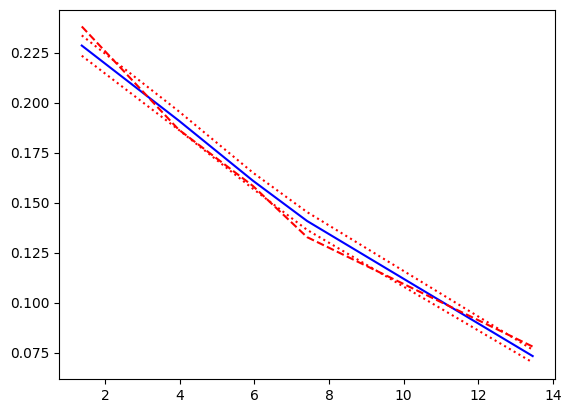

In [141]:
tg = perfil_var(df_saida, 'tempo_emprego', ncat=5)
tg.reset_index().style.format({'score':'{:.1%}', 'tx_ev':'{:.1%}', 'distribuição':'{:.1%}'})

,distribuição,score,tx_ev
idade,,,
"(21.999, 32.0]",0.207521,0.183076,0.182824
"(32.0, 39.0]",0.210958,0.160520,0.160815
"(39.0, 46.0]",0.193640,0.151771,0.153202
"(46.0, 55.0]",0.194299,0.145765,0.144524
"(55.0, 68.0]",0.193581,0.155398,0.155162


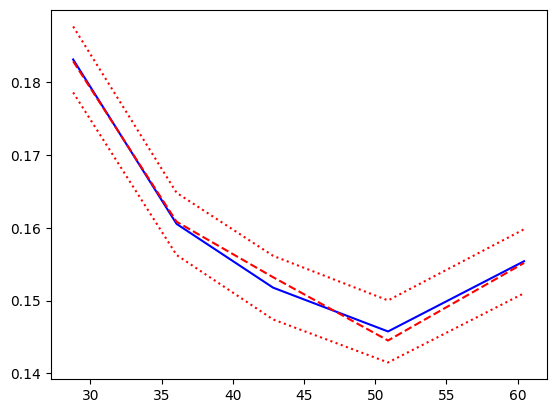

In [142]:
tg = perfil_var(df_saida, 'idade', ncat=5)
tg

,distribuição,score,tx_ev
renda,,,
"(107.669, 1289.45]",0.200010,0.276732,0.339123
"(1289.45, 2121.6]",0.200025,0.217704,0.192120
"(2121.6, 3257.85]",0.199973,0.165520,0.134200
"(3257.85, 5357.91]",0.199996,0.105968,0.088148
"(5357.91, 450578.29]",0.199996,0.032300,0.044630


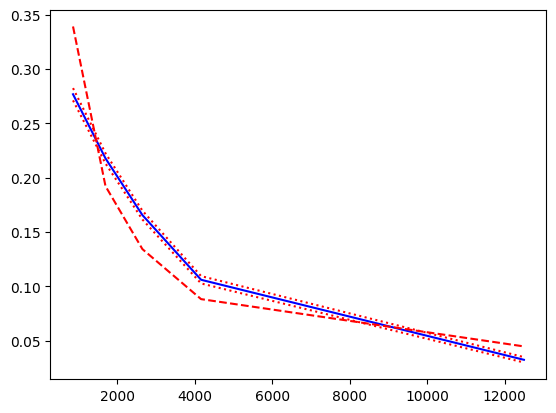

In [143]:
perfil_var(df_saida, 'renda', ncat=5)

,distribuição,score,tx_ev
score,,,
"(-0.001, 0.0715]",0.200025,0.032059,0.044401
"(0.0715, 0.137]",0.199988,0.105486,0.089818
"(0.137, 0.191]",0.200003,0.164750,0.133328
"(0.191, 0.244]",0.199988,0.217130,0.195785
"(0.244, 0.361]",0.199996,0.278835,0.334926


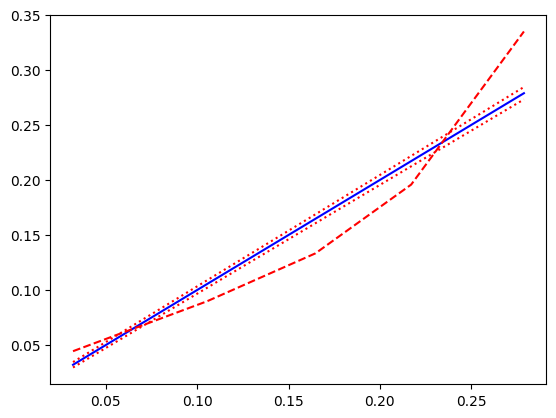

In [144]:
perfil_var(df_saida, 'score', ncat=5)

### Tabela de Ganhos:

In [145]:
df3 = df_saida.sort_values(by='score').reset_index().copy()
df3['tx_mau_acum'] = df3.mau.cumsum()/df3.shape[0]

df3['pct_mau_acum'] = df3.mau.cumsum()/df3.mau.sum()
df3['red_mau_acum'] = 1-df3.pct_mau_acum

df3['pct_aprovacao'] = np.array(range(df3.shape[0]))/df3.shape[0]
df3.head()

,index,linhas_df,sexo,posse_de_veiculo,posse_de_imovel,qtd_filhos,tipo_renda,educacao,estado_civil,tipo_residencia,...,tempo_emprego,qt_pessoas_residencia,renda,mau,bom,score,tx_mau_acum,pct_mau_acum,red_mau_acum,pct_aprovacao
0,70432,670432,F,N,S,1,Assalariado,Sup. Comp e Inc. / Pós,Casado,Casa,...,39.652055,3.0,450578.29,0,1,2.542748e-66,0.0,0.0,1.0,0.000000
1,78985,678985,F,N,S,1,Assalariado,Sup. Comp e Inc. / Pós,Casado,Casa,...,39.652055,3.0,450578.29,0,1,2.542748e-66,0.0,0.0,1.0,0.000007
2,86505,686505,F,N,S,1,Assalariado,Sup. Comp e Inc. / Pós,Casado,Casa,...,39.652055,3.0,450578.29,0,1,2.542748e-66,0.0,0.0,1.0,0.000015
3,70452,670452,F,N,S,1,Assalariado,Sup. Comp e Inc. / Pós,Casado,Casa,...,39.652055,3.0,450578.29,0,1,2.542748e-66,0.0,0.0,1.0,0.000022
4,52411,652411,F,N,S,1,Assalariado,Sup. Comp e Inc. / Pós,Casado,Casa,...,39.652055,3.0,450578.29,0,1,2.542748e-66,0.0,0.0,1.0,0.000030


In [ ]:
fig = px.line(df3, x="pct_aprovacao", y="tx_mau_acum", title='Taxa de maus por %aprovação')
fig.show()

In [147]:
fig = px.line(df3, x="pct_aprovacao", y="red_mau_acum", title='Redução na inadimplência por %aprovação')
fig.show()

In [148]:
df_saida['idade_cat']=pd.qcut(df_saida['idade'], 5, duplicates='drop')
tmp = df_saida.sort_values(by=['idade_cat','score'], ascending=True).copy()
tmp['freq']=1

tmp['freq_ac'] = tmp.groupby(['idade_cat'])['freq'].transform(lambda x: x.cumsum())
tmp['maus_ac'] = tmp.groupby(['idade_cat'])['mau'].transform(lambda x: x.cumsum())
tmp['freq_fx_idade'] = tmp.groupby(['idade_cat'])['freq'].transform(lambda x: x.sum())

tmp['pct_aprovados'] = tmp.freq_ac/tmp['freq_fx_idade']
tmp['tx_maus_pto_corte'] = tmp['maus_ac']/tmp['freq_ac']

tmp

C:\Users\lucca\AppData\Local\Temp\ipykernel_23368\3444563490.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,linhas_df,sexo,posse_de_veiculo,posse_de_imovel,qtd_filhos,tipo_renda,educacao,estado_civil,tipo_residencia,idade,...,mau,bom,score,idade_cat,freq,freq_ac,maus_ac,freq_fx_idade,pct_aprovados,tx_maus_pto_corte
17974,617974,M,N,S,1,Assalariado,Fund / Médio,Casado,Estúdio,31,...,0,1,0.000049,"(21.999, 32.0]",1,1,0,28016,0.000036,0.000000
23189,623189,M,N,S,1,Assalariado,Fund / Médio,Casado,Estúdio,31,...,0,1,0.000049,"(21.999, 32.0]",1,2,0,28016,0.000071,0.000000
26035,626035,M,N,S,1,Assalariado,Fund / Médio,Casado,Estúdio,31,...,0,1,0.000049,"(21.999, 32.0]",1,3,0,28016,0.000107,0.000000
28030,628030,M,N,S,1,Assalariado,Fund / Médio,Casado,Estúdio,31,...,0,1,0.000049,"(21.999, 32.0]",1,4,0,28016,0.000143,0.000000
48588,648588,M,N,S,1,Assalariado,Fund / Médio,Casado,Estúdio,31,...,0,1,0.000049,"(21.999, 32.0]",1,5,0,28016,0.000178,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115813,715813,F,S,N,0,Assalariado,Fund / Médio,Casado,Casa,56,...,0,1,0.340420,"(55.0, 68.0]",1,26130,4053,26134,0.999847,0.155109
120284,720284,F,S,N,0,Assalariado,Fund / Médio,Casado,Casa,56,...,1,0,0.340420,"(55.0, 68.0]",1,26131,4054,26134,0.999885,0.155141
123322,723322,F,S,N,0,Assalariado,Fund / Médio,Casado,Casa,56,...,0,1,0.340420,"(55.0, 68.0]",1,26132,4054,26134,0.999923,0.155135
138276,738276,F,S,N,0,Assalariado,Fund / Médio,Casado,Casa,56,...,0,1,0.340420,"(55.0, 68.0]",1,26133,4054,26134,0.999962,0.155130


In [149]:
fig = px.line(tmp, x="score", y="pct_aprovados", color='idade_cat', title='Taxa de maus por %aprovação')
fig.show()